In [8]:
%config InlineBackend.figure_format = 'retina'
# %matplotlib qt

In [32]:

import copy
from pathlib import Path
import numpy as np
import sys
from time import time, ctime
import warnings
from astropy.io import fits
from astropy.table import Table
from astropy.modeling.fitting import LevMarLSQFitter
from astropy.stats import sigma_clipped_stats, gaussian_fwhm_to_sigma
from astropy.table import Table
from astropy.nddata import NDData, CCDData
from astropy.utils.exceptions import AstropyWarning
from astropy.visualization import simple_norm
from photutils.aperture import CircularAperture, ApertureStats
from photutils.detection import DAOStarFinder, find_peaks
from photutils.psf import extract_stars, EPSFBuilder
from photutils.psf import DAOPhotPSFPhotometry, BasicPSFPhotometry
from photutils.psf import DAOGroup
from photutils.psf.epsf_stars import EPSFStars
from photutils.psf.utils import _extract_psf_fitting_names
from photutils.psf.utils import get_grouped_psf_model
from photutils.detection import IRAFStarFinder
from photutils.background import MMMBackground, MADStdBackgroundRMS
from photutils.segmentation import make_source_mask
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import patches
import sep

sys.setrecursionlimit(10**7)
plt.rcParams["font.family"] = 'Times New Roman'
plt.rcParams["font.size"] = 15
plt.rcParams["text.usetex"] = False
plt.rcParams["mathtext.fontset"] = 'cm'

warnings.simplefilter('ignore', category=AstropyWarning)

HOME = Path.home()
DATADIR = HOME/'class'/'tao23'/'TAO23'/'tutorials'/'data'/'proj2'

In [10]:
def zscale_imshow(ax, img, vmin=None, vmax=None, **kwargs):
    if vmin==None or vmax==None:
        interval = ZScaleInterval()
        _vmin, _vmax = interval.get_limits(img)
        if vmin==None:
            vmin = _vmin
        if vmax==None:
            vmax = _vmax
    im = ax.imshow(img, vmin=vmin, vmax=vmax, origin='lower', **kwargs)
    
    return im

def read_sci_data(fpath, show=True, newbyteorder=False, bkgsubtract=False):
    ccd_raw = CCDData.read(fpath, unit='nmgy') # be careful about the unit!
    ccd = CCDData.read(fpath, unit='nmgy')
    
    data = ccd.data
    
    data_mean, data_med, data_std = sigma_clipped_stats(data, sigma=2.)
    ccd.mask = data < data_mean - 3*data_std 
    ccd.data[ccd.mask] = data_med
    ccd.data -= data_med
    ccd.mask = (ccd.mask) & (data > 10.)
    if newbyteorder:
        ccd.data = ccd.data.byteswap().newbyteorder()
        
    n = len(ccd.data)
    if bkgsubtract:
        bkgsubs = []
        for i in range(n):
            bkgsub = background_substraction(ccd.data[i])
            bkgsubs.append(bkgsub)
        ccd.data = np.array(bkgsubs)
    
    if show:
        fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
        for i in range(n):
            im = zscale_imshow(axes[i], ccd.data[i], cmap='gray')
            divider = make_axes_locatable(axes[i])
            cax = divider.append_axes('right', size='5%', pad=0.05)
            fig.colorbar(im, cax=cax, orientation='vertical')
            
            band = ccd.header[f'BAND{i}']
            
            axes[i].text(0.98, 0.02, f'${band}$-band',
                         transform=axes[i].transAxes,
                         va='bottom', ha='right', c='k',
                         bbox=dict(boxstyle='round', facecolor='w', alpha=0.9))
            
        plt.tight_layout()
        
    return ccd, ccd_raw

def background_substraction(img, box=100, filt=3, show=True):
    mask = make_source_mask(img, nsigma=2, npixels=1, dilate_size=3)
    bkg_sep = sep.Background(img.byteswap().newbyteorder(), 
                             mask=mask, bw=box, bh=box, fw=filt, fh=filt)
    bkgsub_sep = img - bkg_sep.back()
    
    if show:
        fig, axs = plt.subplots(2, 3, figsize=(10, 8))
        axs[1, 1].axis("off")
        
        data2plot = [
            dict(ax=axs[0, 0], arr=img,              title="Original data"),
            dict(ax=axs[0, 1], arr=bkg_sep.back(),   title=f"bkg (filt={filt:d}, box={box:d})"),
            dict(ax=axs[0, 2], arr=bkgsub_sep,       title="bkg subtracted"),
            dict(ax=axs[1, 0], arr=mask,             title="Mask"),
            # dict(ax=axs[1, 1], arr=bkg_sep.background_mesh,   title="bkg mesh"),
            dict(ax=axs[1, 2], arr=10*bkg_sep.rms(), title="10 * bkg RMS")
        ]
        
        for dd in data2plot:
            im = zscale_imshow(dd['ax'], dd['arr'])
            cb = fig.colorbar(im, ax=dd['ax'], orientation='horizontal')
            # cb.ax.set_xticklabels([f'{x:.3f}' for x in cb.get_ticks()])#, rotation=45)
            dd['ax'].set_title(dd['title'])
        
        plt.tight_layout()
    
    return bkgsub_sep

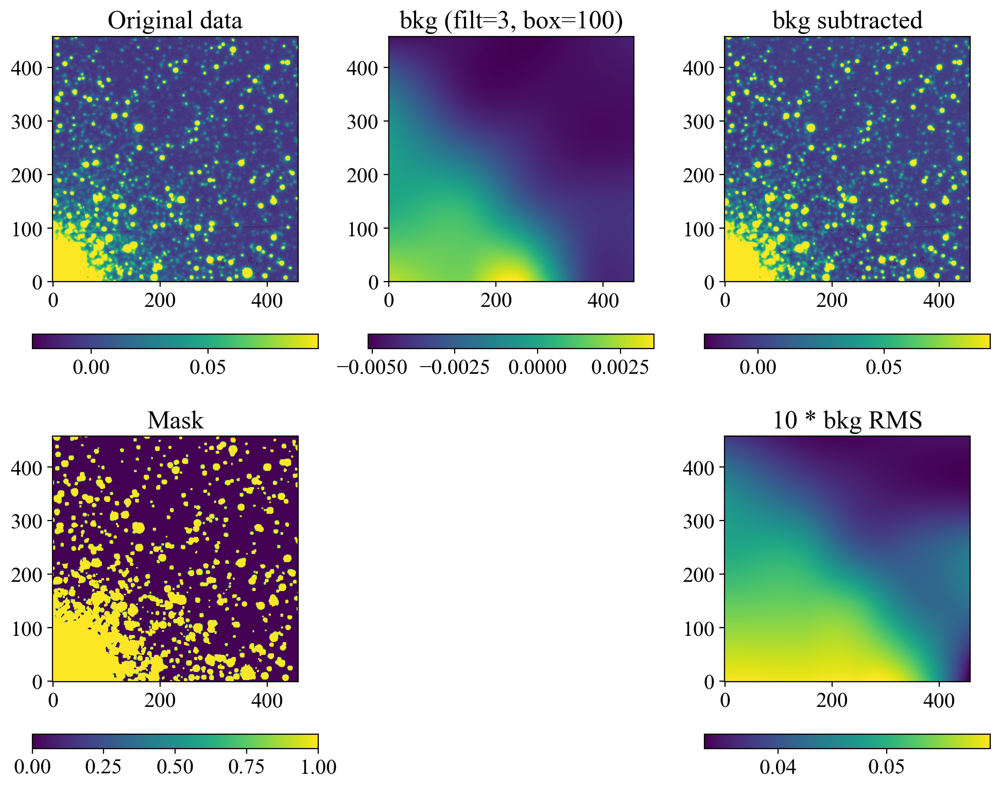

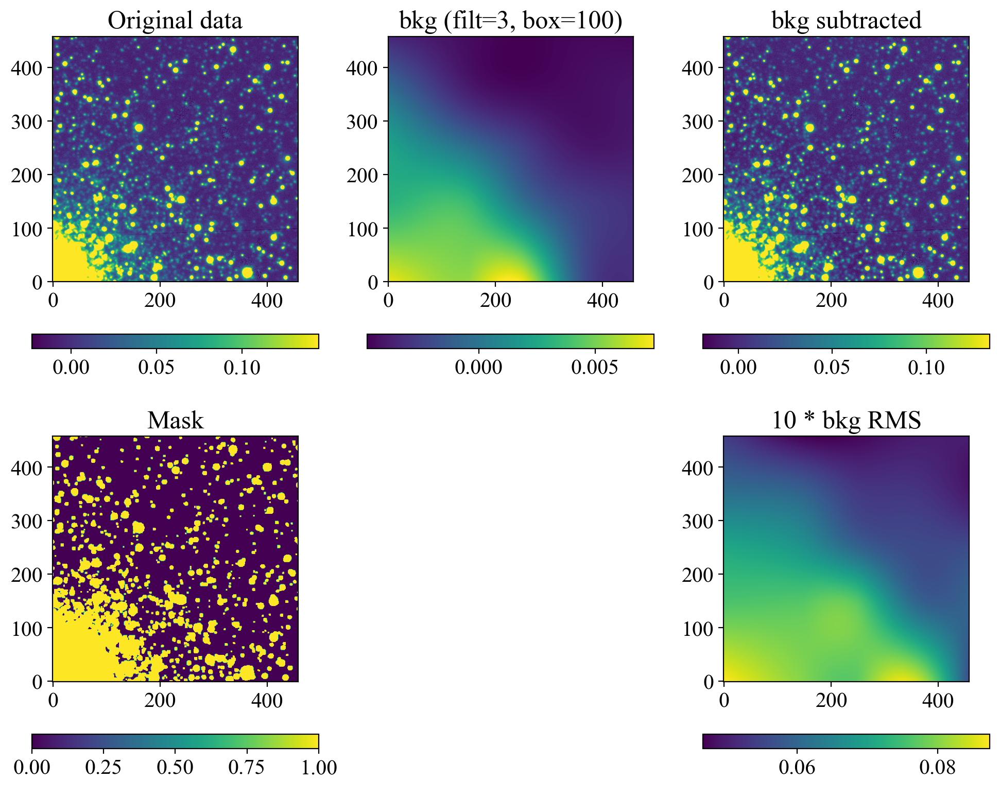

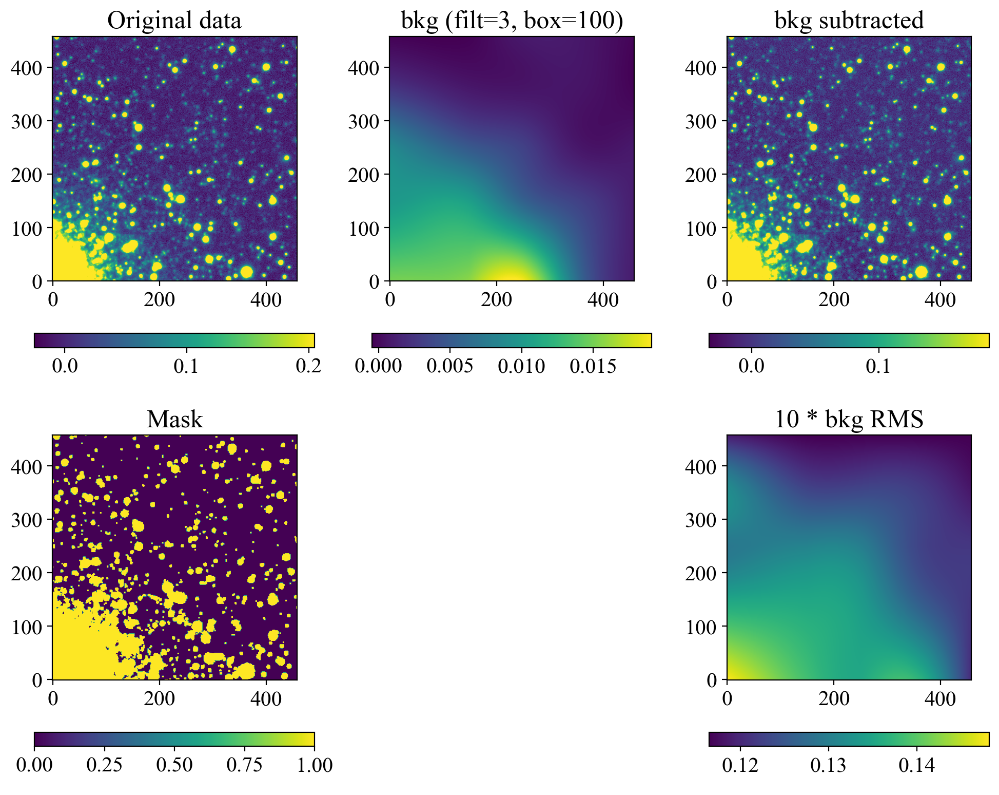

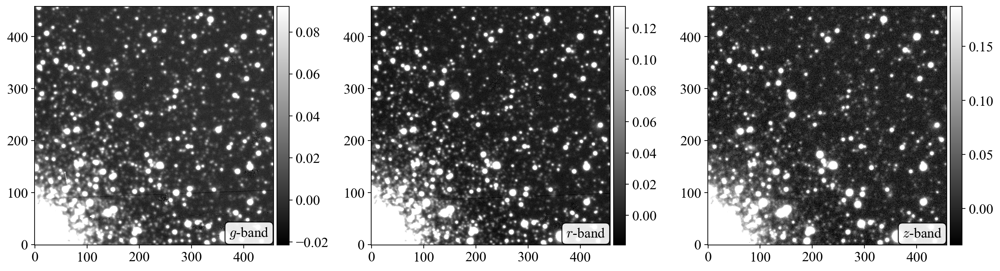

In [11]:
ccd, ccd_raw = read_sci_data(DATADIR/'NGC2210.grz.fits',bkgsubtract=True)

x_peak y_peak  peak_value
------ ------ -----------
   211      0 0.017702816
   221      0  0.02585933
   234      0 0.066292875
   397      0 0.015439065
   426      0  0.01929489
   456      0 0.025402183
   214      1 0.014840436
   ...    ...         ...
    43    455  0.10767186
   238    455 0.055923179
   202    456 0.019755991
   312    456 0.022179311
    52    457  0.02953851
    62    457 0.046513576
   176    457  0.36708906
   382    457 0.021643179
Length = 918 rows
 x   y 
--- ---
268  24
427  34
332  35
293  40
311  42
385  61
412  82
... ...
 41 354
377 374
229 394
400 399
305 400
 23 406
438 408
336 432
Length = 42 rows


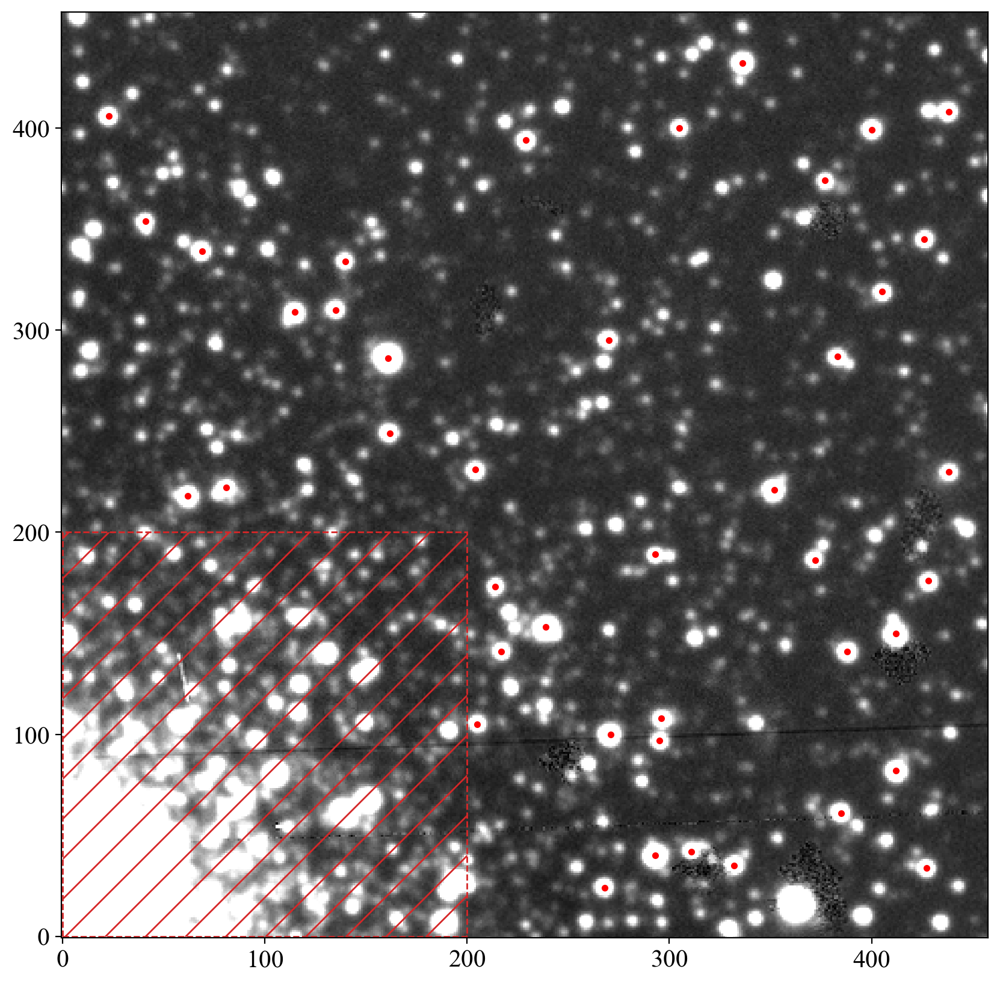

In [12]:
bands = ['g', 'r', 'z']
i = 0
band = bands[i]
data = ccd.data[i]
mask = ccd.mask[i]

bkgrms = MADStdBackgroundRMS()
std = bkgrms(data)
thres = 3*std

find_mask = np.zeros_like(data, dtype=bool)
# find_mask[250:650, 250:650] = True
ll, hh = 0, 200
find_mask[ll:hh, ll:hh] = True
peaks_tbl = find_peaks(data, threshold=thres, mask=find_mask)
peaks_tbl['peak_value'].info.format = '%.8g'

print(peaks_tbl)

# select stars within the cutout of specified size
size = 25
hsize = (size - 1) / 2
x = peaks_tbl['x_peak']  
y = peaks_tbl['y_peak']  
bound = ((x > hsize) & (x < (data.shape[1] -1 - hsize)) &
         (y > hsize) & (y < (data.shape[0] -1 - hsize)))
bright = (peaks_tbl['peak_value'] > 0.5) & (peaks_tbl['peak_value'] < 10.)

bbmask = (bound & bright)
bx, by = x[bbmask], y[bbmask]

isolated = [False if np.count_nonzero(np.sqrt((bx-xi)**2+(by-yi)**2)<size) > 1
            else True for xi, yi in zip(bx, by)]

mask_stars = isolated
mask_stars = np.ones_like(bx, dtype=bool)

stars_tbl = Table()
stars_tbl['x'] = bx[mask_stars]  
stars_tbl['y'] = by[mask_stars]

print(stars_tbl)

nddata = NDData(data=data, mask=ccd.mask[i])

# plot the locations of our selected stars
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
im = zscale_imshow(ax, data, cmap='gray')
ax.plot(stars_tbl['x'], stars_tbl['y'], '.r')
rect = patches.Rectangle((ll,ll), hh-ll, hh-ll, ec='tab:red', ls='--',
                         hatch='/', fc='none', lw=1)
ax.add_patch(rect)

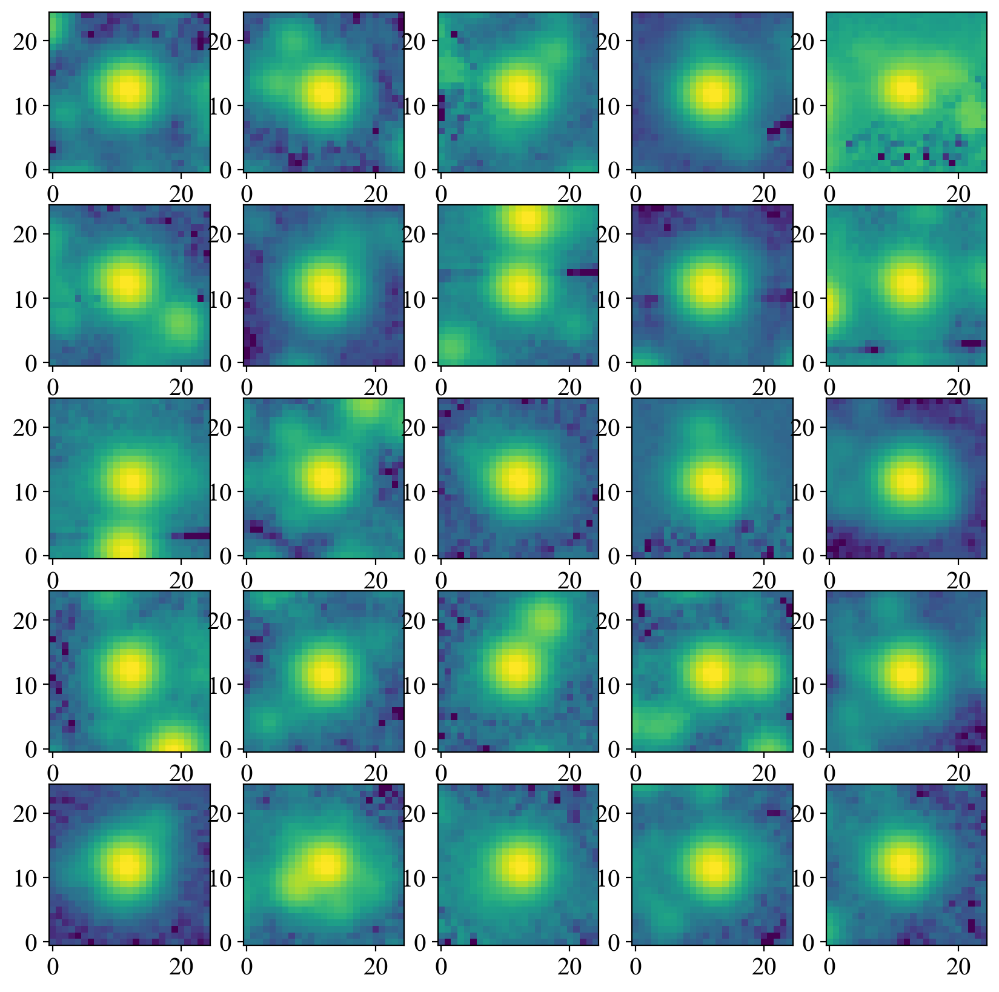

In [13]:
# extract cutouts of our selected stars
stars = extract_stars(nddata, stars_tbl, size=size)

# plot cutouts
nrows = 5
ncols = 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 10),
                       squeeze=True)
ax = ax.ravel()
for i in range(nrows * ncols):
    norm = simple_norm(stars[i], 'log', percent=99.0)
    ax[i].imshow(stars[i], norm=norm, origin='lower', cmap='viridis')

# derive fwhm from aperture statistics
cap = CircularAperture(stars.center_flat, size/5.)
apstat = ApertureStats(data, cap)

fwhm_mean, fwhm_med, fwhm_std = sigma_clipped_stats(apstat.fwhm.value,
                                                    sigma=3.0)

In [14]:

def get_epsf(stars, band,
             oversampling=4, maxiters=10, smoothing_kernel='quadratic',
             show=True, ncols=10, figsize=(10, 6)):
    
    if show:
        nrows = int(np.ceil(len(stars)/ncols))
        fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize,
                               squeeze=True)
        axs = axs.ravel()
        for ax in axs:
            ax.axis('off')
        for i in range(len(stars)):
            norm = simple_norm(stars[i], 'log', percent=99.)
            axs[i].imshow(stars[i], norm=norm, origin='lower', cmap='viridis')
        fig.text(0.95,0.05,f'{band}-band',
                  ha='right', va='bottom', fontsize=15)
        # plt.title(f'Picked stars to model PSF ({band})')
        plt.tight_layout()
        
    epsf_builder = EPSFBuilder(oversampling=oversampling, maxiters=maxiters,
                               progress_bar=False,
                               smoothing_kernel=smoothing_kernel)  
    epsf, fitted_stars = epsf_builder(stars)
    
    if show:
        plt.figure()
        norm = simple_norm(epsf.data, 'log', percent=99.)
        plt.imshow(epsf.data, norm=norm, origin='lower', cmap='viridis')
        plt.title(f'Effective PSF ({band})')
        plt.colorbar()
        
    return epsf


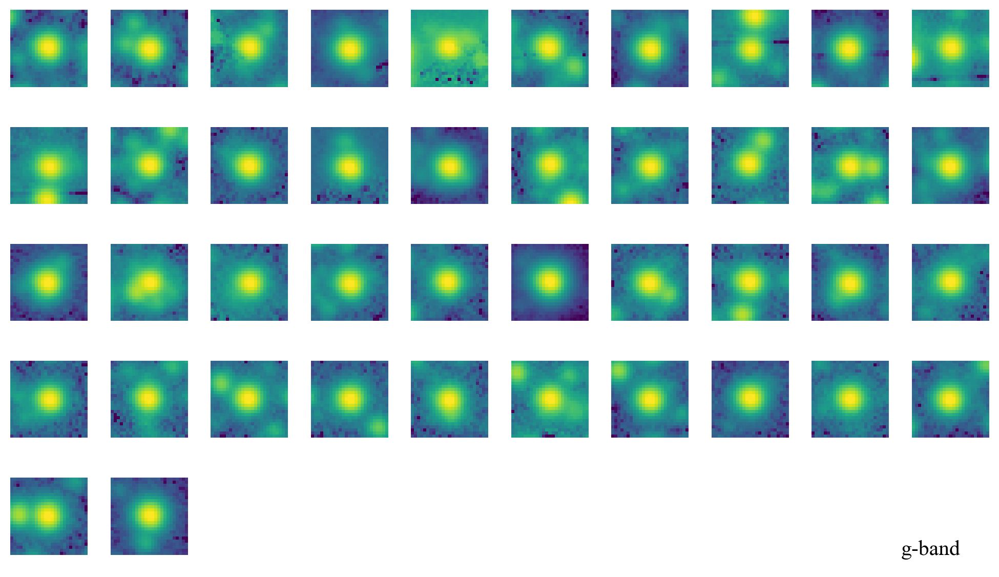

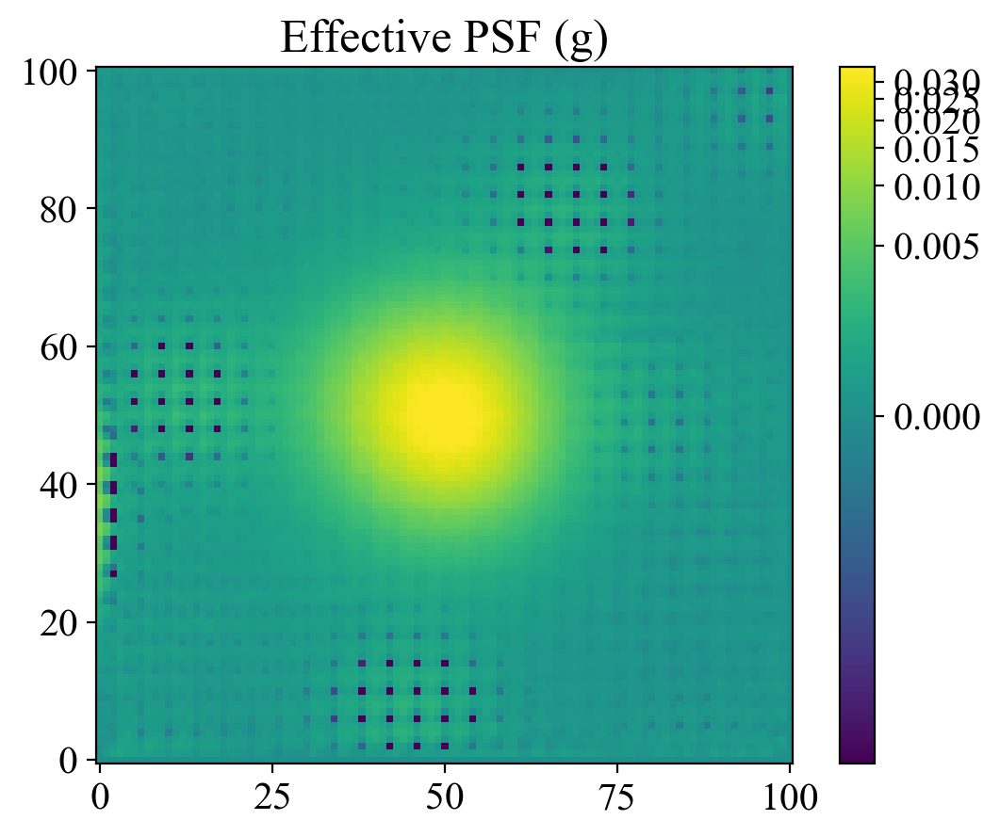

In [15]:
epsf0 = get_epsf(stars, band)

In [16]:
# substar procedure
# subtract adjacent star profiles using the epsf model we obtained.

def get_substars(stars, psf_model, thres, fwhm, band, peakmax=None,
            show=True, ncols=10, figsize=(10, 6)):
    substars_list = []
    for star in stars:
        finder = DAOStarFinder(threshold=thres, fwhm=fwhm,
                               roundhi=5.0, roundlo=-5.0,
                               sharplo=0.0, sharphi=2.0, peakmax=peakmax)
        found = finder(star.data)
        found.rename_columns(['xcentroid', 'ycentroid', 'flux'],
                             ['x_0', 'y_0', 'flux_0'])
        if len(found) > 1:
            fitter = LevMarLSQFitter()
            y, x = np.indices(star.shape)
            xname, yname, fluxname = _extract_psf_fitting_names(psf_model)
            pars_to_set = {'x_0': xname, 'y_0': yname, 'flux_0': fluxname}
            group_psf = get_grouped_psf_model(psf_model, found, pars_to_set)
            fit_model = fitter(group_psf, x, y, star.data)
            
            if hasattr(star, 'cutout_center'):
                xc, yc = star.cutout_center
            elif hasattr(star, 'cutout_center_flat'):
                xc, yc = star.cutout_center_flat[0]
            else:
                raise AttributeError
            idx = np.argmin((found['x_0']-xc)**2+(found['y_0']-yc)**2) # crude
            cent_model = fit_model[idx]
            
            substar = copy.deepcopy(star)
            substar._data = star.data - fit_model(x, y) + cent_model(x, y)
        else:
            substar = star
            
        substars_list.append(substar)
    
    substars = EPSFStars(substars_list)
    return substars

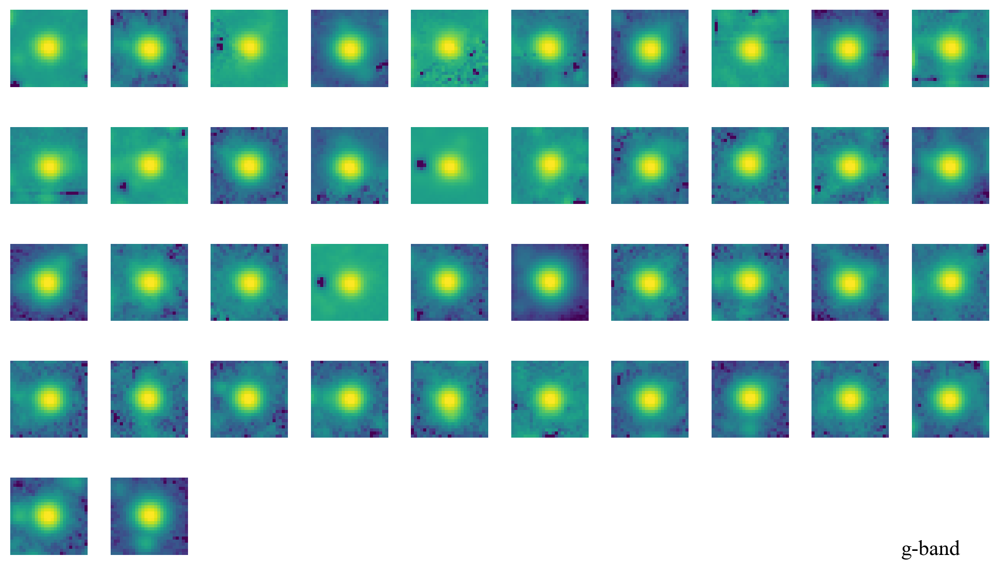

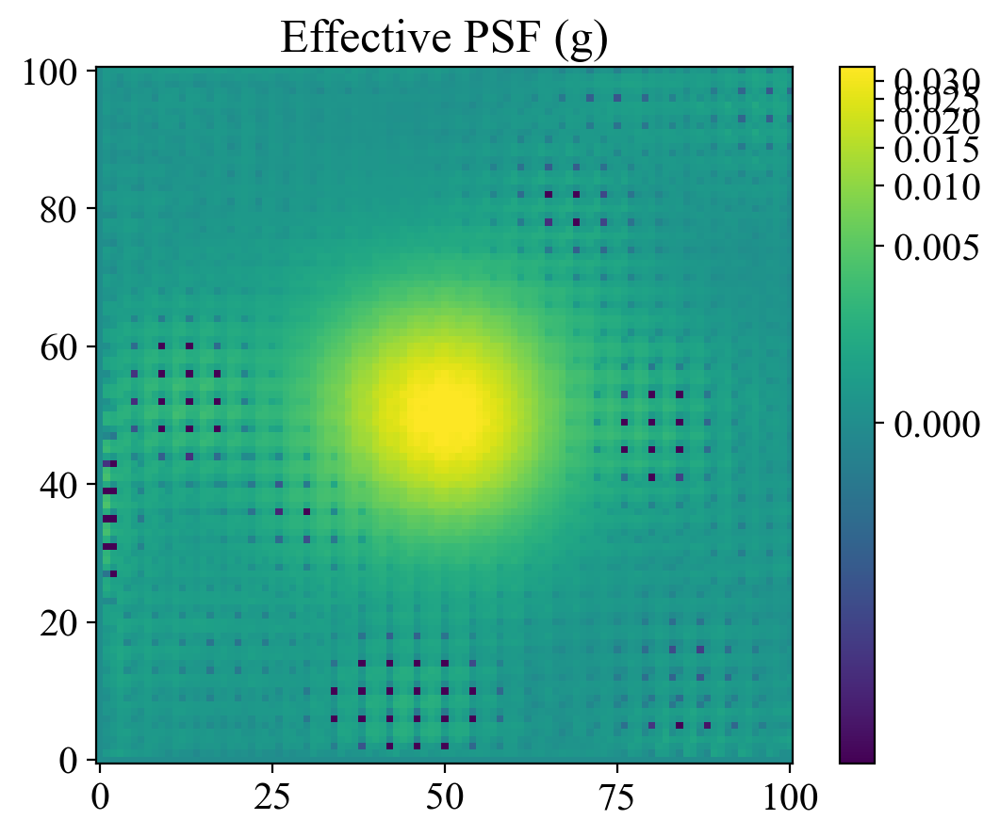

In [21]:
substars = get_substars(stars, epsf0, 2*std, fwhm_mean, band)
epsf1 = get_epsf(substars, band)

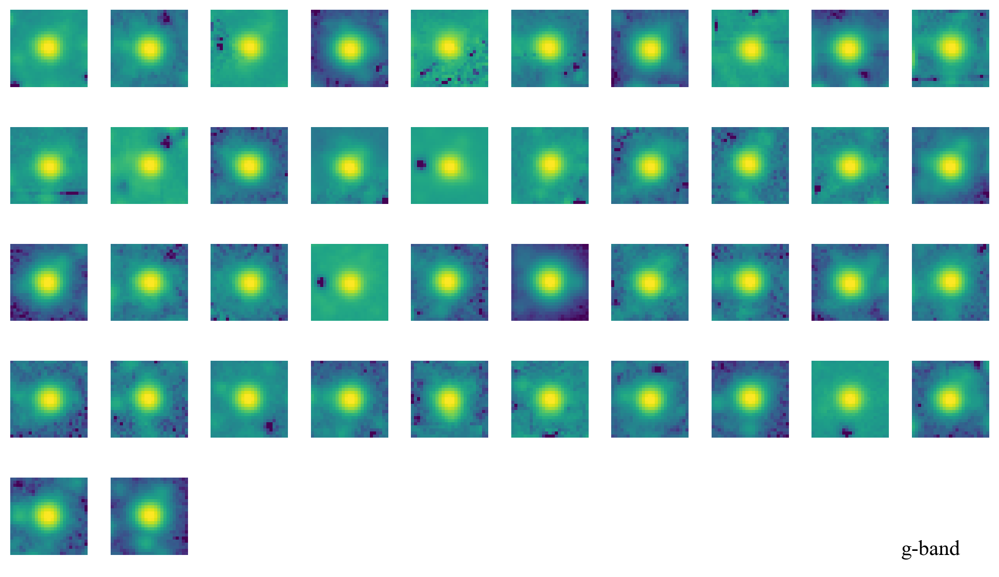

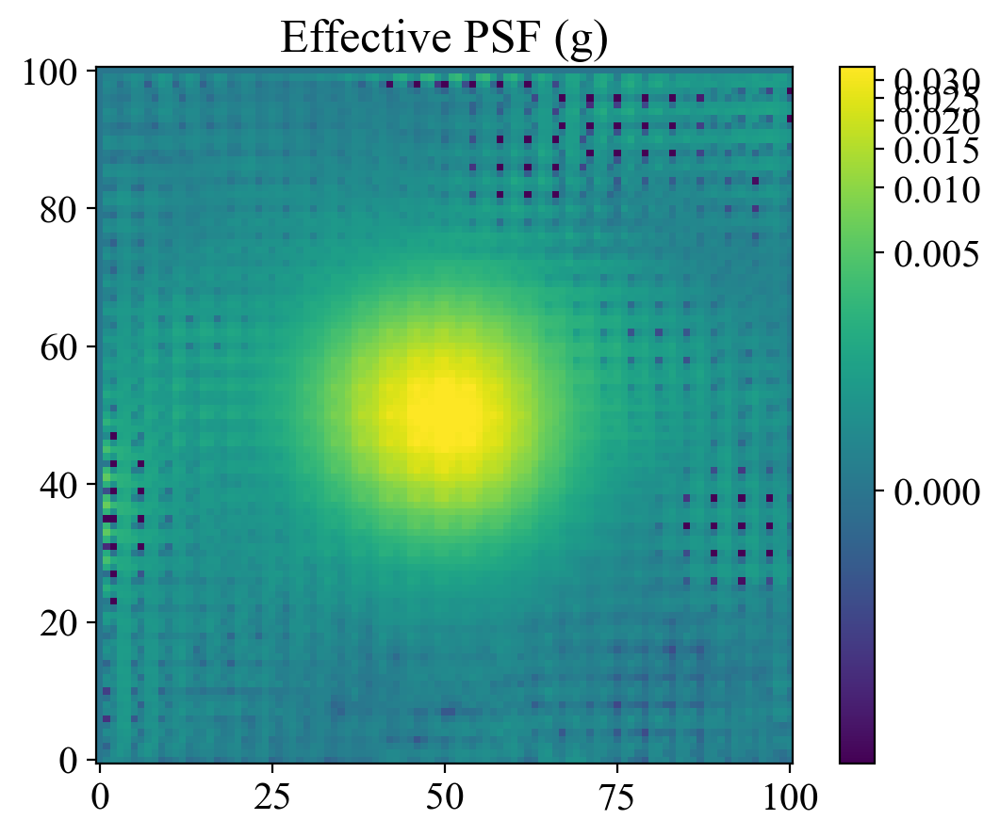

In [22]:
substars2 = get_substars(substars, epsf0, 1*std, fwhm_mean, band)
epsf2 = get_epsf(substars2, band)

In [ ]:

def get_psfphot(data, mask, psf_model, fwhm, psf_size, sigma_thres=3.,
                peakmax=None, psf_class='basic'):
    bkgrms = MADStdBackgroundRMS()
    std = bkgrms(data)
    
    threshold = sigma_thres * std
    crit_separation = 2.0 * fwhm
    
    daogroup = DAOGroup(crit_separation)
    # daogroup = DBSCANGroup(crit_separation)
    mmm_bkg = MMMBackground()
    # fitter = LMLSQFitter()
    fitter = LevMarLSQFitter()
    
    fsize = int(np.ceil(psf_size))
    fitshape = fsize if fsize%2 == 1 else fsize +1
    
    if psf_class == 'basic':
        iraffind = IRAFStarFinder(threshold=threshold,
                                  fwhm=fwhm, #sigma_psf * gaussian_sigma_to_fwhm,
                                  minsep_fwhm=0.01, roundhi=5.0, roundlo=-5.0,
                                  sharplo=0.0, sharphi=2.0, peakmax=peakmax)
        stars = iraffind(data, mask=mask)
        
        photometry = BasicPSFPhotometry(finder=iraffind,
                                        group_maker=daogroup,
                                        bkg_estimator=mmm_bkg,
                                        psf_model=psf_model,
                                        fitter=fitter,
                                        aperture_radius=1.5*fwhm,
                                        # niters=1,
                                        fitshape=fitshape)
    elif psf_class == 'daophot':
        daofind = DAOStarFinder(threshold=threshold,
                                fwhm=fwhm, #sigma_psf * gaussian_sigma_to_fwhm,
                                roundhi=5.0, roundlo=-5.0,
                                sharplo=0.0, sharphi=2.0, peakmax=peakmax)
        stars = daofind(data, mask=mask)
    
        photometry = DAOPhotPSFPhotometry(crit_separation, threshold=threshold,
                                           fwhm=fwhm, psf_model=psf_model,
                                           fitshape=fitshape,
                                           aperture_radius=1.5*fwhm,
                                           roundhi=5.0, roundlo=-5.0,
                                           sharplo=0.0, sharphi=2.0)
    
    stars.rename_columns(['xcentroid','ycentroid','flux'],
                         ['x_0', 'y_0', 'flux_0'])
    
    start = time()
    print('start time -', ctime(start))
    
    result_tab = photometry.do_photometry(image=data, mask=mask,
                                          init_guesses=stars,
                                          progress_bar=True)
    residual_image = photometry.get_residual_image()
    
    finish = time()
    print('finish time -', ctime(finish))
    print(f'elapsed time - {(finish-start)/60:.2f} min')
    
    # result_tab_dao = daophot(image=data, progress_bar=True)
    # residual_image_dao = daophot.get_residual_image()
    
    # after_dao = time()
    # print('after dao -', ctime(after_dao))
    # print(f'elapsed time - {(after_dao-after_basic)/60:.2f} min')
    # print(f'total elapsed time - {(after_dao-start)/60:.2f} min')

    shape = data.shape
    result_tab = discard_stars_outside(shape, result_tab)
    # result_tab_dao = discard_stars_outside(shape, result_tab_dao)
    # result_tab_dao = result_tab_dao[result_tab_dao['flux_fit'] > 0]

    return result_tab, photometry


def discard_stars_outside(shape, result_tab):
    ny, nx = shape
    xin = np.logical_and(result_tab['x_fit'] > 0 , result_tab['x_fit'] < nx-1)
    yin = np.logical_and(result_tab['y_fit'] > 0 , result_tab['y_fit'] < ny-1)
    isin = np.logical_and(xin, yin)
    return result_tab[isin]



In [ ]:
# set fwhm, psf_model, psf_size, sigma_thres, peakmax
fwhm = fwhm_med # median fwhm of selected stars
sigma_psf = fwhm * gaussian_fwhm_to_sigma # sigma of psf
psf_model = epsf2 # epsf model - 2nd iteration
psf_size = fwhm * 4 # size of psf model to fit
sigma_thres = 5.0 # threshold for star detection
peakmax = 10.0 # maximum peak value for star detection (prevent saturated stars)

# get photometry by BasicPSFPhotometry
res = get_psfphot(data, mask, psf_model, fwhm, psf_size,
                  sigma_thres=sigma_thres, peakmax=peakmax, psf_class='basic')

result_tab, photometry = res # extract result table and photometry object
residual_image = photometry.get_residual_image() # residual_image = data - model

# get photometry by DAOPhotPSFPhotometry
res = get_psfphot(data, mask, psf_model, fwhm, psf_size,
                  sigma_thres=sigma_thres, peakmax=peakmax,
                  psf_class='daophot')

result_tab_dao, photometry_dao = res
residual_image_dao = photometry_dao.get_residual_image()

In [ ]:
# save results
hdu = fits.PrimaryHDU(residual_image)
hdu_dao = fits.PrimaryHDU(residual_image_dao)
hdu.writeto(DATADIR/f'res_{band}_{sigma_thres:.1f}.fits', overwrite=True)
hdu_dao.writeto(DATADIR/f'res_{band}_{sigma_thres:.1f}_dao.fits', overwrite=True)
result_tab.write(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}.csv', format='csv', overwrite=True)
result_tab_dao.write(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}_dao.csv', format='csv', overwrite=True)

In [36]:
def show_psfphot_result(data, band, result_tab, residual_image,
                        result_tab_dao, residual_image_dao):
    fig, axs = plt.subplots(2, 3, figsize=(10, 10))
    interval = ZScaleInterval()
    vmin, vmax = interval.get_limits(data)
    
    zscale_imshow(axs[0][0], data, vmin, vmax)
    zscale_imshow(axs[1][0], data, vmin, vmax)
    zscale_imshow(axs[0][1], data - residual_image, vmin, vmax)
    zscale_imshow(axs[0][2], residual_image, vmin, vmax)
    zscale_imshow(axs[1][1], data - residual_image_dao, vmin, vmax)
    zscale_imshow(axs[1][2], residual_image_dao, vmin, vmax)    
    axs[0][0].plot(result_tab['x_fit'], result_tab['y_fit'], marker='+', c='r', ms=1, ls='None')
    axs[1][0].plot(result_tab_dao['x_fit'], result_tab_dao['y_fit'], marker='+', c='r', ms=1, ls='None')
    axs[0][2].text(0.95, 0.07, f'{band}-band', ha='right', va='bottom',
                   c='w', fontweight='bold', transform=axs[0][2].transAxes)
    axs[1][2].text(0.95, 0.07, f'{band}-band', ha='right', va='bottom',
                   c='w', fontweight='bold', transform=axs[1][2].transAxes)
    axs[0][2].text(0.95, 0.01, 'Iraf star finder', ha='right', va='bottom',
                   c='w', fontweight='bold', transform=axs[0][2].transAxes)
    axs[1][2].text(0.95, 0.01, 'DAO star finder', ha='right', va='bottom',
                   c='w', fontweight='bold', transform=axs[1][2].transAxes)
    axs[0][0].set_title('Original')
    axs[0][1].set_title('Model')
    axs[0][2].set_title('Subtracted')
    axs = axs.ravel()
    for ax in axs:
        ax.axis('off')
    
    plt.tight_layout()
    
    return fig

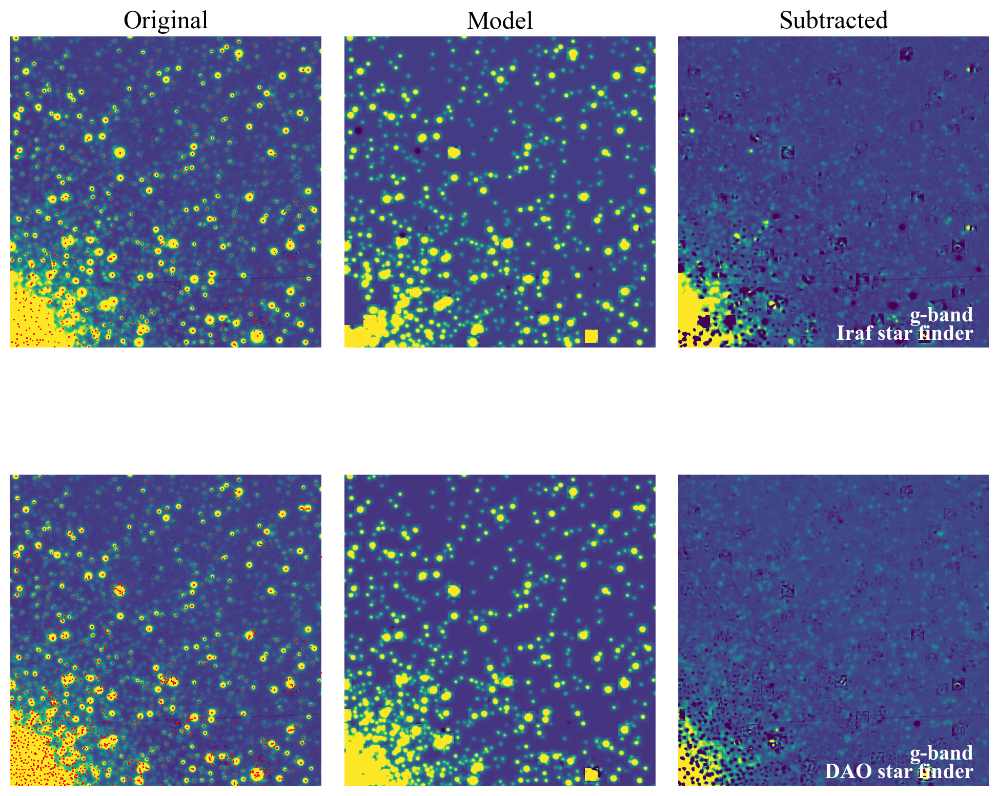

In [37]:
# plot results - data, model, residual
fig = show_psfphot_result(data, band, result_tab, residual_image,
                          result_tab_dao, residual_image_dao)

In [38]:
# Let's do the same for all bands
bands = ['g', 'r', 'z']
for i in range(1, len(bands)):
    band = bands[i]
    data = ccd.data[i]
    mask = ccd.mask[i]

    print(f'### Band: {band}')
    bkgrms = MADStdBackgroundRMS()
    std = bkgrms(data)
    thres = 3*std

    find_mask = np.zeros_like(data, dtype=bool)
    ll, hh = 0, 200
    find_mask[ll:hh, ll:hh] = True
    peaks_tbl = find_peaks(data, threshold=thres, mask=find_mask)
    peaks_tbl['peak_value'].info.format = '%.8g'

    # select stars within the cutout of specified size
    size = 25
    hsize = (size - 1) / 2
    x = peaks_tbl['x_peak']  
    y = peaks_tbl['y_peak']  
    bound = ((x > hsize) & (x < (data.shape[1] -1 - hsize)) &
            (y > hsize) & (y < (data.shape[0] -1 - hsize)))
    bright = (peaks_tbl['peak_value'] > 0.5) & (peaks_tbl['peak_value'] < 10.)

    bbmask = (bound & bright)
    bx, by = x[bbmask], y[bbmask]

    isolated = [False if np.count_nonzero(np.sqrt((bx-xi)**2+(by-yi)**2)<size) > 1
                else True for xi, yi in zip(bx, by)]

    mask_stars = isolated
    mask_stars = np.ones_like(bx, dtype=bool)

    stars_tbl = Table()
    stars_tbl['x'] = bx[mask_stars]  
    stars_tbl['y'] = by[mask_stars]

    print(stars_tbl)

    nddata = NDData(data=data, mask=ccd.mask[i])

    # plot the locations of our selected stars
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    im = zscale_imshow(ax, data, cmap='gray')
    ax.plot(stars_tbl['x'], stars_tbl['y'], '.r')
    rect = patches.Rectangle((ll,ll), hh-ll, hh-ll, ec='tab:red', ls='--',
                            hatch='/', fc='none', lw=1)
    ax.add_patch(rect)

    # extract cutouts of our selected stars
    stars = extract_stars(nddata, stars_tbl, size=size)

    # derive fwhm from aperture statistics
    cap = CircularAperture(stars.center_flat, size/5.)
    apstat = ApertureStats(data, cap)

    fwhm_mean, fwhm_med, fwhm_std = sigma_clipped_stats(apstat.fwhm.value,
                                                        sigma=3.0)

    epsf0 = get_epsf(stars, band)
    substars = get_substars(stars, epsf0, 2*std, fwhm_mean, band)
    epsf1 = get_epsf(substars, band)
    substars2 = get_substars(substars, epsf0, 1*std, fwhm_mean, band)
    epsf2 = get_epsf(substars2, band)

    fwhm = fwhm_med
    sigma_psf = fwhm * gaussian_fwhm_to_sigma
    psf_model = epsf2
    psf_size = fwhm * 4
    sigma_thres = 5.
    peakmax=10.0

    res = get_psfphot(data, mask, psf_model, fwhm, psf_size,
                    sigma_thres=sigma_thres, peakmax=peakmax, psf_class='basic')

    result_tab, photometry = res
    residual_image = photometry.get_residual_image()

    res = get_psfphot(data, mask, psf_model, fwhm, psf_size,
                    sigma_thres=sigma_thres, peakmax=peakmax,
                    psf_class='daophot')

    result_tab_dao, photometry_dao = res
    residual_image_dao = photometry_dao.get_residual_image()

    hdu = fits.PrimaryHDU(residual_image)
    hdu_dao = fits.PrimaryHDU(residual_image_dao)
    hdu.writeto(DATADIR/f'res_{band}_{sigma_thres:.1f}.fits', overwrite=True)
    hdu_dao.writeto(DATADIR/f'res_{band}_{sigma_thres:.1f}_dao.fits', overwrite=True)
    result_tab.write(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}.csv', format='csv', overwrite=True)
    result_tab_dao.write(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}_dao.csv', format='csv', overwrite=True)

    show_psfphot_result(data, band, result_tab, residual_image,
                            result_tab_dao, residual_image_dao)

 x   y 
--- ---
268  24
427  34
332  35
293  40
311  42
385  61
287  77
... ...
229 394
400 399
305 400
219 403
 23 406
438 408
247 411
336 432
Length = 58 rows
start time - Tue Mar 28 14:36:24 2023


Star Group:   0%|          | 0/593 [00:00<?, ?it/s]

finish time - Tue Mar 28 14:36:44 2023
elapsed time - 0.33 min
start time - Tue Mar 28 14:36:44 2023


Star Group:   0%|          | 0/543 [00:00<?, ?it/s]